In [7]:
# Usual suspect
import numpy as np
import sys
import math
import pandas as pd
from typing import Tuple
sys.path.insert(1, '../../muograph')

%reload_ext autoreload
%autoreload 2

# **Muon scattering tomography reconstruction: Optimal choice of Gaussian smoothing kernel**

In [8]:
# Replace the 
input_hits_csv = "../../data/iron_barrel/barrel_and_cubes_scattering.csv"
pd.read_csv(input_hits_csv).columns

Index(['Event', 'X0', 'Y0', 'Z0', 'Edep0', 'X1', 'Y1', 'Z1', 'Edep1', 'X2',
       'Y2', 'Z2', 'Edep2', 'X3', 'Y3', 'Z3', 'Edep3', 'X4', 'Y4', 'Z4',
       'Edep4', 'X5', 'Y5', 'Z5', 'Edep5', 'E', 'Theta'],
      dtype='object')

# **Muon hits**

In [9]:
import torch
from hits.hits import Hits

# Load incoming hits from csv
hits_in = Hits(
    plane_labels=(0, 1, 2),
    csv_filename=input_hits_csv,
    )

# Load outgoing hits from csv
hits_out = Hits(
    plane_labels=(3, 4, 5), 
    csv_filename=input_hits_csv,
    )

### **Hits above**

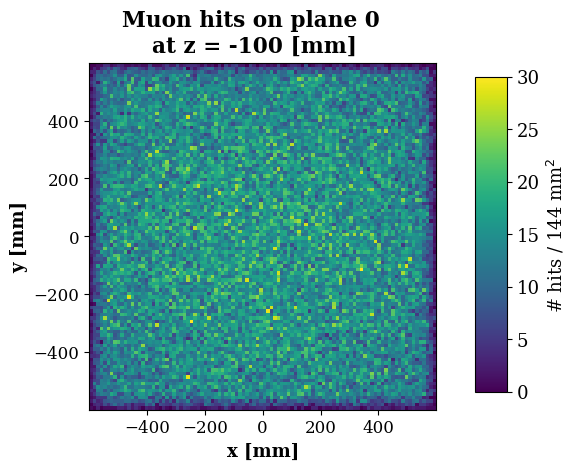

In [10]:
# Plot hits on the first panel from the top
hits_in.plot_hits(0)

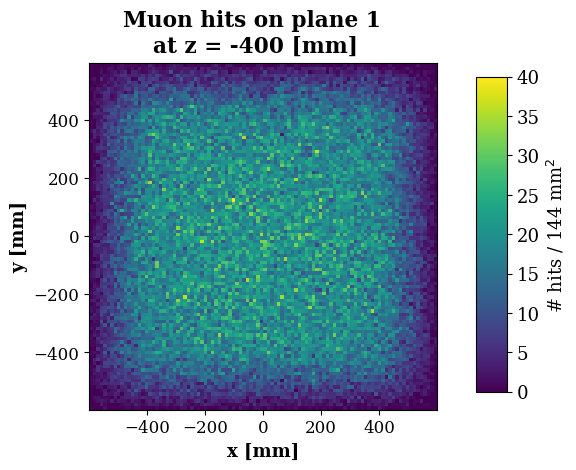

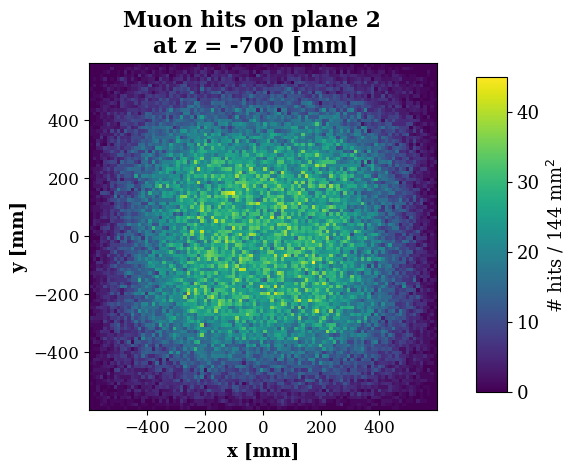

In [11]:
hits_in.plot_hits(1)# Plot hits on the second panel from the top
hits_in.plot_hits(2)# Plot hits on the third panel from the top

 **Questions**

1 - **Why** does the **pattern** of the hits on the panels **changes** between the first panel from the top to the third panel from the top?

2 - Explain **why** the **concentration** of hits is **higher** in the **center** of lower panels.

***Help***:
You might want to draw the whole detection setup, and remember that only muon passing through all detector panels get recorded!

### **Hits below**

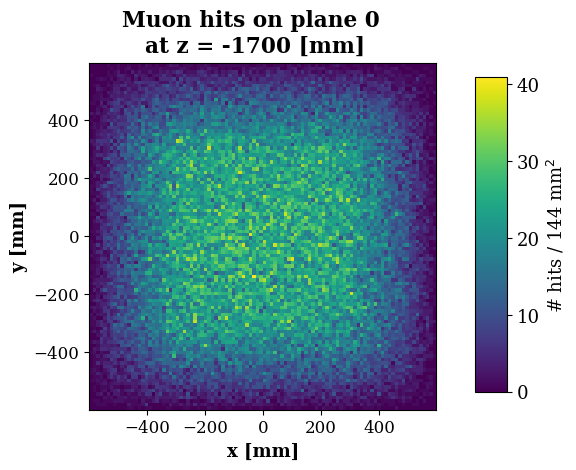

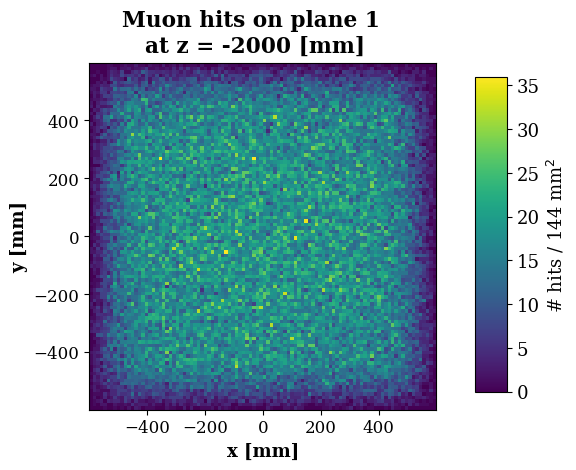

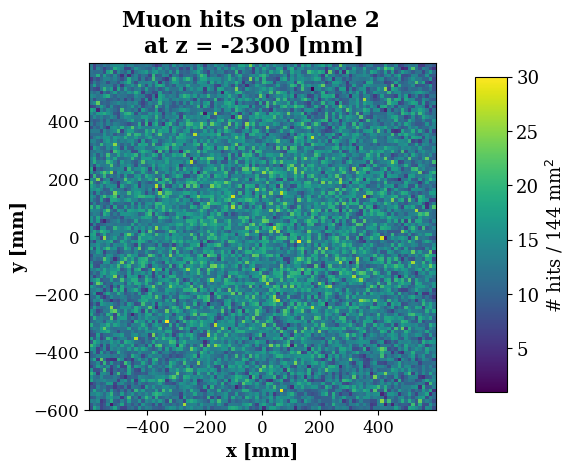

In [12]:
hits_out.plot_hits(0)# Plot hits on the first panel from the top
hits_out.plot_hits(1)# Plot hits on the second panel from the top
hits_out.plot_hits(2)# Plot hits on the third panel from the top

 **Questions**

1 - Again, **explain** why the **2D distribution** of **hits** gets **larger** as you go towards lower panels.


# **Tracking**


In [13]:
# Output directory where to save the plots and data
output_dir = "../../output/exercice1/"

from tracking.tracking import Tracking

# Compute the muon tracks for the incoming hits
tracks_in = Tracking(
    hits = hits_in, 
    label = "above", 
    output_dir=output_dir)


../../output/exercice1 directory already exists
Class attributes saved at ../../output/exercice1/tracks_above_.hdf5


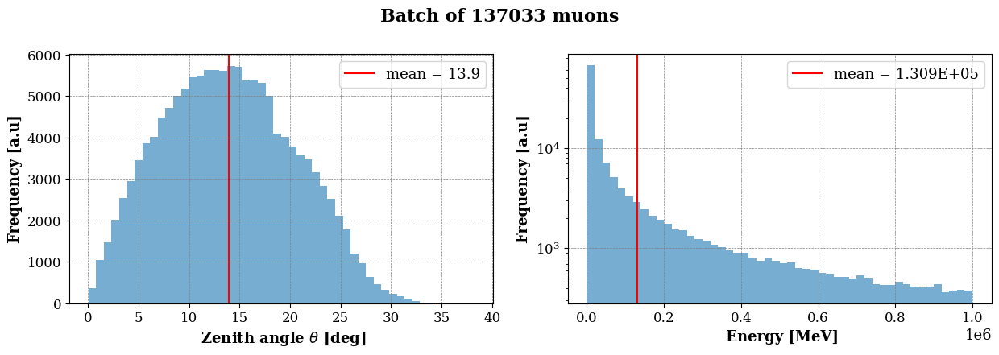

In [14]:
tracks_in.plot_muon_features()

In [15]:
# Compute the muon tracks for the outgoing hits
tracks_out = Tracking(hits = hits_out, label = "below", output_dir=output_dir)


../../output/exercice1 directory already exists
Class attributes saved at ../../output/exercice1/tracks_below_.hdf5


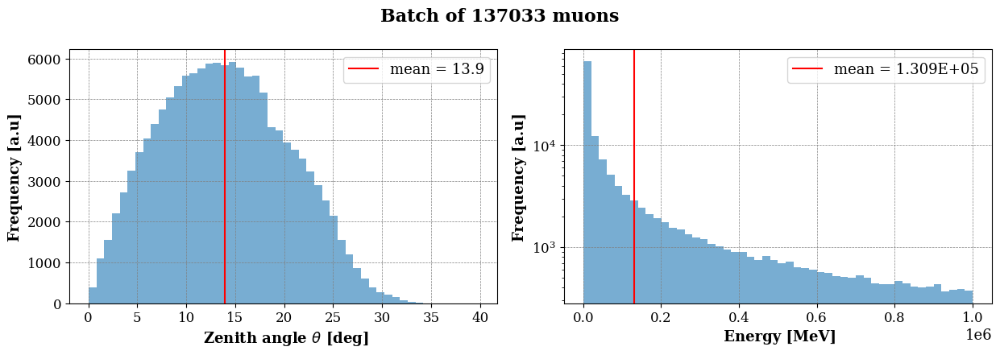

In [16]:
tracks_out.plot_muon_features()

In [19]:
from tracking.tracking import TrackingMST

# Load from tracking files
tracking_files = [
    output_dir + "tracks_above_.hdf5",
    output_dir + "tracks_below_.hdf5"
]
# Combine tracking of incoming and outgoing hits into a single object
mst = TrackingMST(tracking_files = tracking_files)


/home/geant/Desktop/TASKS/Muograph/MuographBeta/output directory already exists

Tracking attributes loaded from ../../output/exercice1/tracks_above_.hdf5

Tracking attributes loaded from ../../output/exercice1/tracks_below_.hdf5
0 muon removed due to detector efficiency


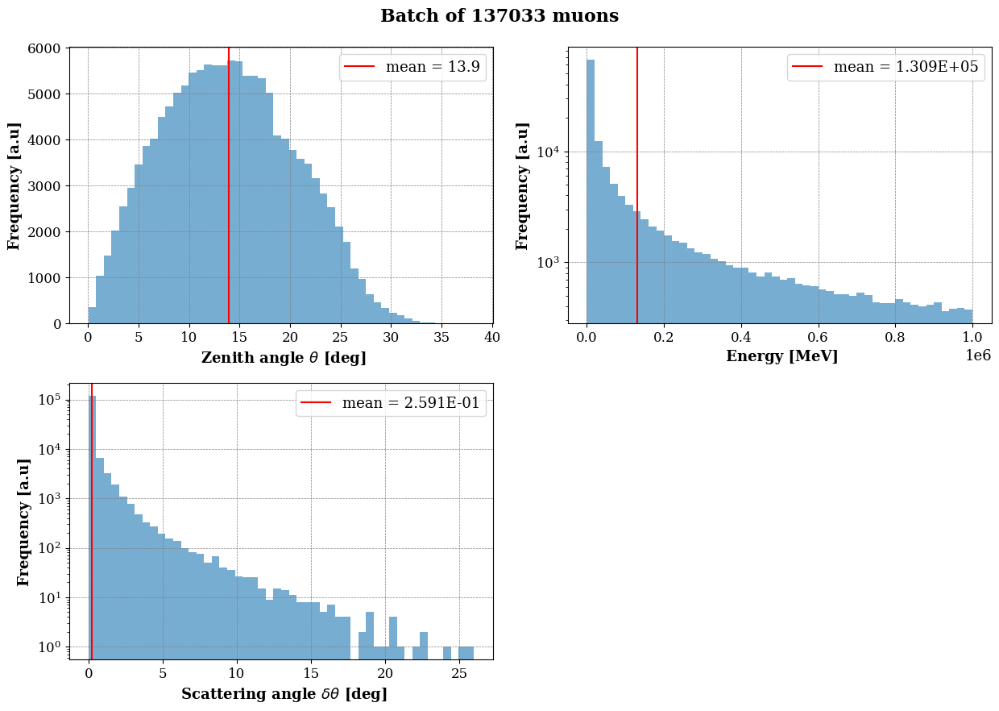

In [20]:
# Plot the features of the muons
mst.plot_muon_features(figname="test_plot")

# **Reconstruction**

### POCA

We run the POCA algorithm by including all the muons in the dataset.

In [21]:
# Define the volume of interest

from volume.volume import Volume
voi = Volume(
    position = [0,0,-1200],
    dimension=[1000,600,600],
    voxel_width=20)

In [22]:
from reconstruction.poca import POCA

poca = POCA(
    tracking=mst, # The tracks
    voi = voi,# The volume of interest
    output_dir=output_dir + "poca/", # The path to the diretcory wherre to save the data
)


../../output/exercice1/poca directory created

Assigning voxel to each POCA point:


/home/geant/Desktop/TASKS/Muograph/MuographBeta/examples/exercices/../../muograph/reconstruction/poca.py:17: UserWarning: Using torch.cross without specifying the dim arg is deprecated.
Please either pass the dim explicitly or simply use torch.linalg.cross.
The default value of dim will change to agree with that of linalg.cross in a future release. (Triggered internally at /home/conda/feedstock_root/build_artifacts/libtorch_1718580401398/work/aten/src/ATen/native/Cross.cpp:62.)
  cross_prod = torch.cross(v1, v2)


Class attributes saved at ../../output/exercice1/poca/poca.hdf5


Plot 3D scattering density predictions on 2D projections.

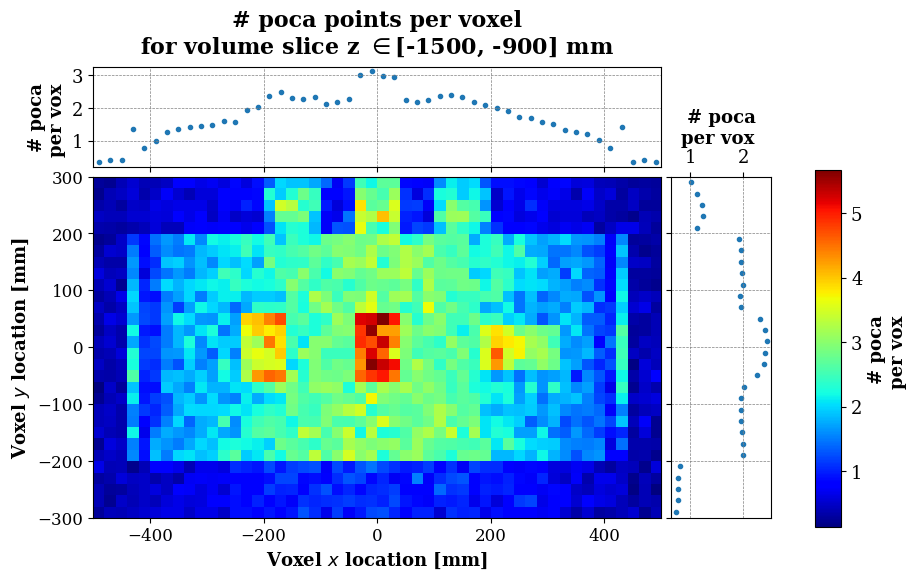

In [23]:
dim = 2

# Plot the predictions in the XY plane
poca.plot_pred_slice(
    voi = voi, # The volume of interest
    xyz_voxel_preds=poca.n_poca_per_vox, # 3D prediction to plot
    dim = 2, # Projection, 2 == XY projection
    filename = str(poca.output_dir) + "/no_dtheta_cut", # Where to save the plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 1), # The range of voxels to consider
    fig_suptitle="# poca points per voxel", # Title of the figure
    pred_label = "# poca\nper vox",
    pred_unit = ""
)

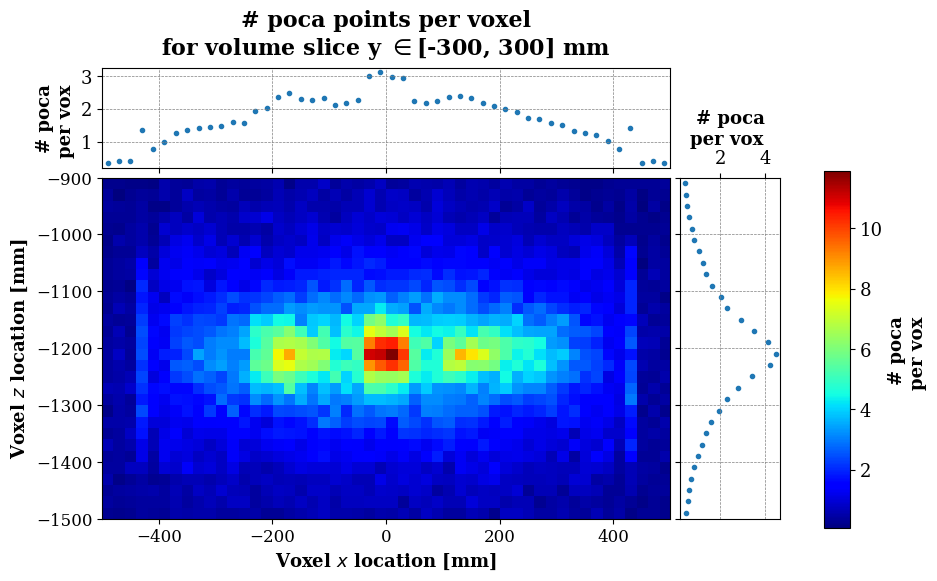

In [24]:
dim = 1

# Plot the predictions in the XZ plane
poca.plot_pred_slice(
    voi = voi, # The volume of interest
    xyz_voxel_preds=poca.n_poca_per_vox, # 3D prediction to plot
    dim = 1, # Projection, 1 == XZ projection
    filename = str(poca.output_dir) + "/no_dtheta_cut", # Where to save the plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 1), # The range of voxels to consider
    fig_suptitle="# poca points per voxel", # Title of the figure
    pred_label = "# poca\nper vox",
    pred_unit = ""
)

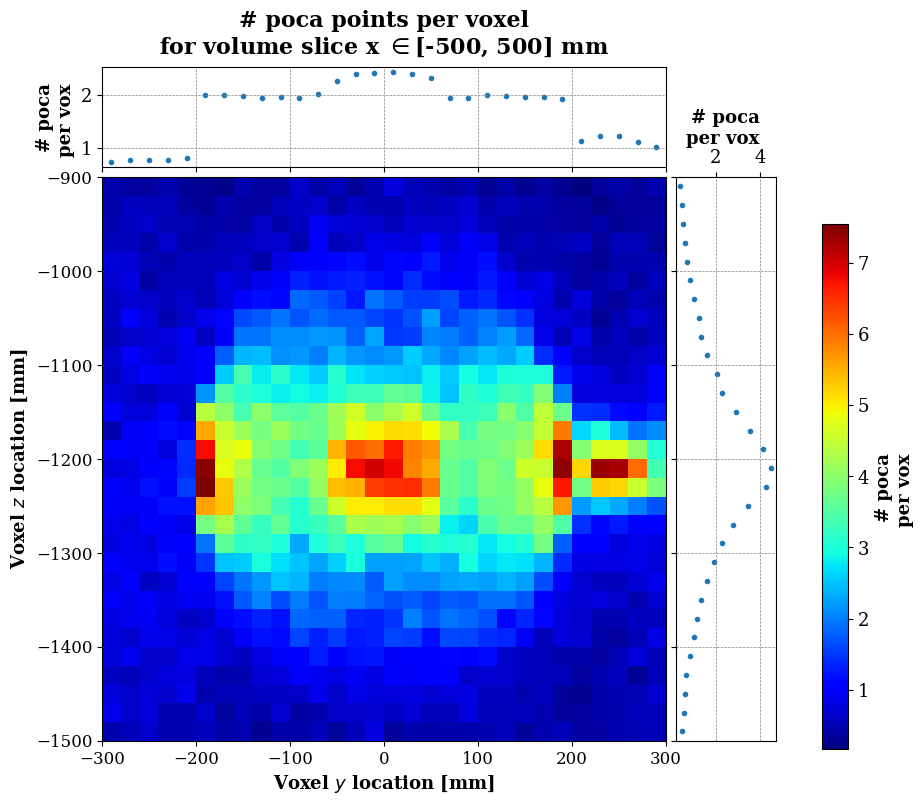

In [25]:
dim = 0

# Plot the predictions in the YZ plane
poca.plot_pred_slice(
    voi = voi, # The volume of interest
    xyz_voxel_preds=poca.n_poca_per_vox, # 3D prediction to plot
    dim = 0, # Projection, 0 == YZ projection
    filename = str(poca.output_dir) + "/no_dtheta_cut", # Where to save the plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 1), # The range of voxels to consider
    fig_suptitle="# poca points per voxel", # Title of the figure
    pred_label = "# poca\nper vox",
    pred_unit = ""
)

Plot 3D scattering density predictions by slices as 2D projections.

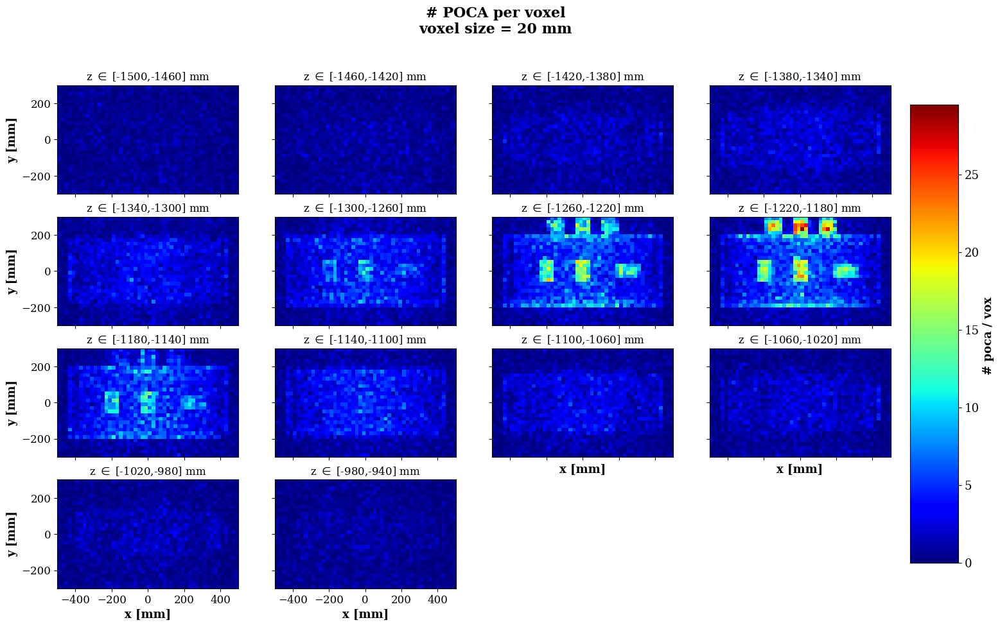

In [26]:
dim = 2 # XY view

poca.plot_pred_by_slice(
    voi = voi, # the volume of interest
    dim = dim, # Projection, 2 == XY projection
    xyz_voxel_preds=poca.n_poca_per_vox, # 3D prediction to plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 2), # The range of voxels to consider
    ncols = 4, # The number of columns in the plot
    nslice_per_plot=2, # The number of voxel layer per plot
    filename = str(poca.output_dir) + "/no_dtheta_cut", # Where to save the plot
    fig_suptitle="# POCA per voxel",
    colorbar_label="# poca / vox",
)

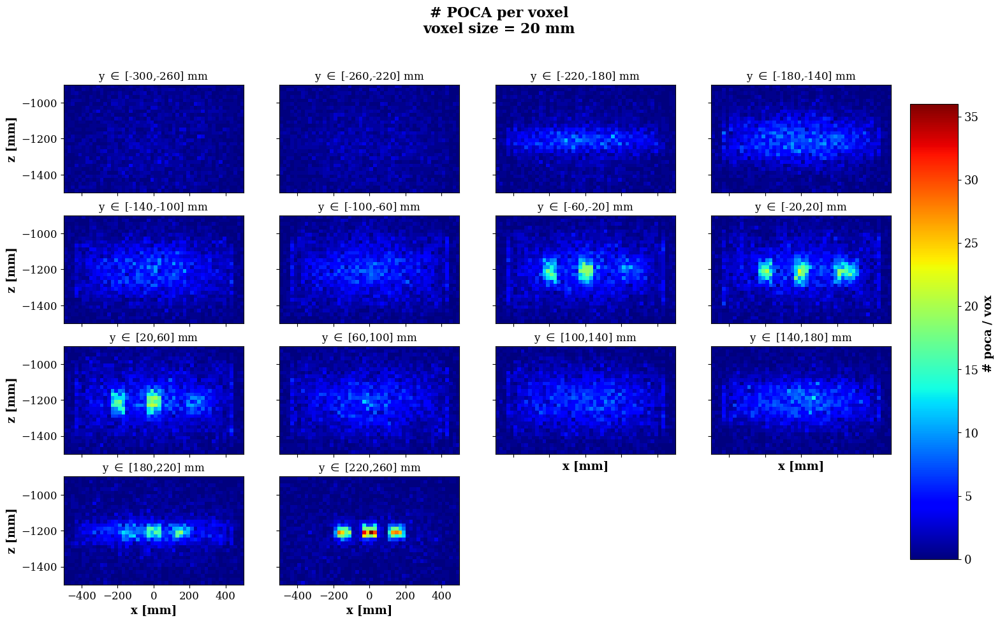

In [27]:
dim = 1 # XY view

poca.plot_pred_by_slice(
    voi = voi, # the volume of interest
    dim = dim,
    xyz_voxel_preds=poca.n_poca_per_vox, # 3D prediction to plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 2), # The range of voxels to consider
    ncols = 4, # The number of columns in the plot
    nslice_per_plot=2, # The number of voxel layer per plot
    filename = str(poca.output_dir) + "/no_dtheta_cut", # Where to save the plot
    fig_suptitle="# POCA per voxel",
    colorbar_label="# poca / vox",
)

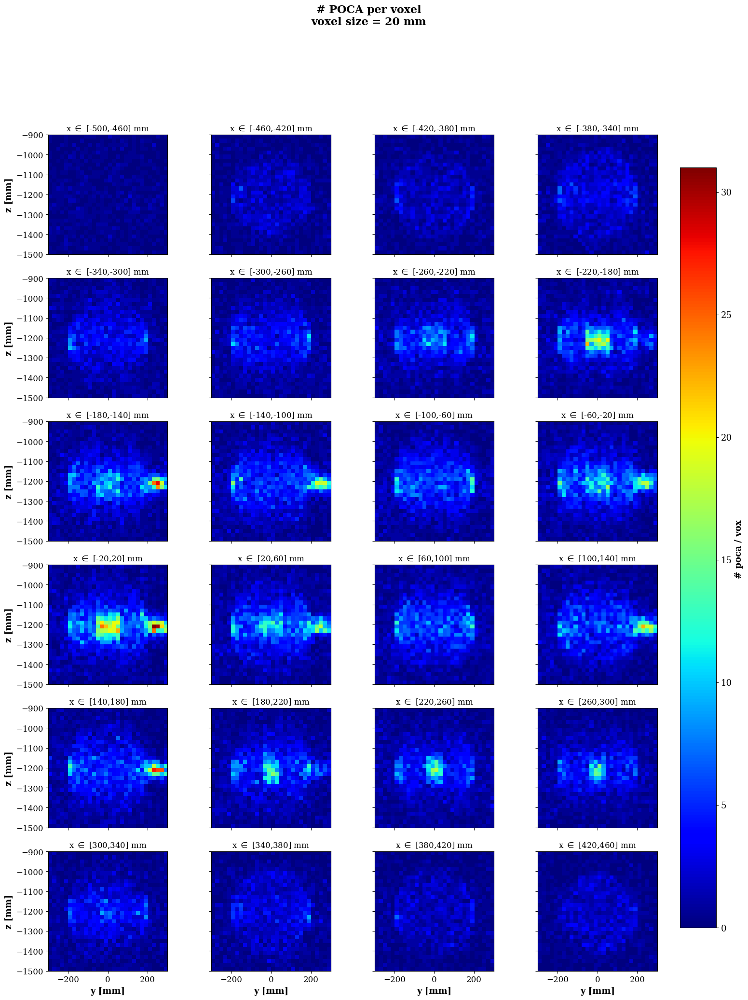

In [28]:
dim = 0 # XY view

poca.plot_pred_by_slice(
    voi = voi, # the volume of interest
    dim = dim,
    xyz_voxel_preds=poca.n_poca_per_vox, # 3D prediction to plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 2), # The range of voxels to consider
    ncols = 4, # The number of columns in the plot
    nslice_per_plot=2, # The number of voxel layer per plot
    filename = str(poca.output_dir) + "/no_dtheta_cut", # Where to save the plot
    fig_suptitle="# POCA per voxel",
    colorbar_label="# poca / vox",
)

We can improve the predictions by applying gaussian smoothing on the 3D voxel-wise predictions.

More details about Gaussian smoothing can be found [here](https://www.cse.psu.edu/~rtc12/CSE486/lecture04.pdf) and [here](https://medium.com/@Coursesteach/computer-vision-part-25-gaussian-filter-c81ea05a4630).

In [29]:
from utils.tools import apply_gaussian_filter

sigma_x, sigma_y, sigma_z = 1., 1., 1.
sigma = (sigma_x, sigma_y, sigma_z)

smooth_prediction_1 = apply_gaussian_filter(
    poca.n_poca_per_vox, # The 3D array to smooth
    sigma=sigma # The width of the kernel along x, y, and z
    )

/home/geant/micromamba/envs/sb/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Let's plot the smoothed predictions:

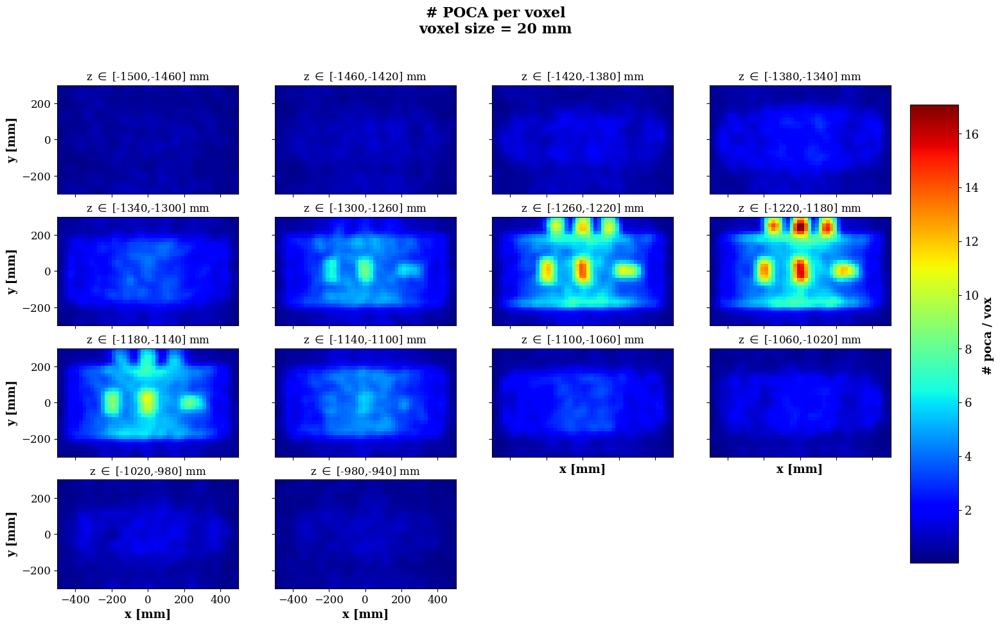

In [30]:
dim = 2 # XY view

poca.plot_pred_by_slice(
    voi = voi, # the volume of interest
    dim = dim, # Projection, 2 == XY projection
    xyz_voxel_preds=smooth_prediction_1, # 3D prediction to plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 2), # The range of voxels to consider
    ncols = 4, # The number of columns in the plot
    nslice_per_plot=2, # The number of voxel layer per plot
    filename = str(poca.output_dir) + "/no_dtheta_cut_smooth", # Where to save the plot
    fig_suptitle="# POCA per voxel",
    colorbar_label="# poca / vox",
)

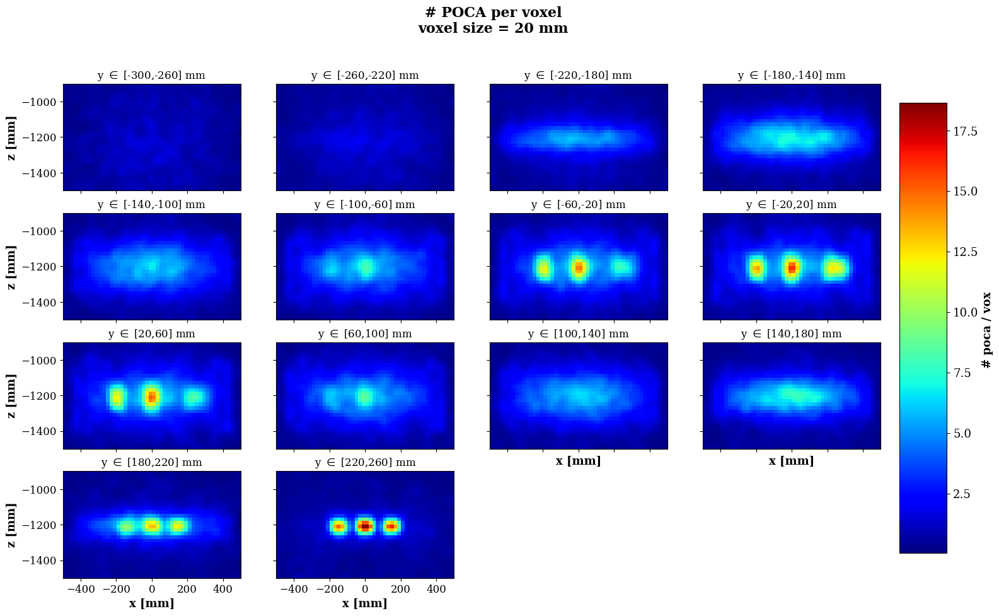

In [31]:
dim = 1 # XZ view

poca.plot_pred_by_slice(
    voi = voi, # the volume of interest
    dim = dim, # Projection
    xyz_voxel_preds=smooth_prediction_1, # 3D prediction to plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 2), # The range of voxels to consider
    ncols = 4, # The number of columns in the plot
    nslice_per_plot=2, # The number of voxel layer per plot
    filename = str(poca.output_dir) + "/no_dtheta_cut_smooth", # Where to save the plot
    fig_suptitle="# POCA per voxel",
    colorbar_label="# poca / vox",
)

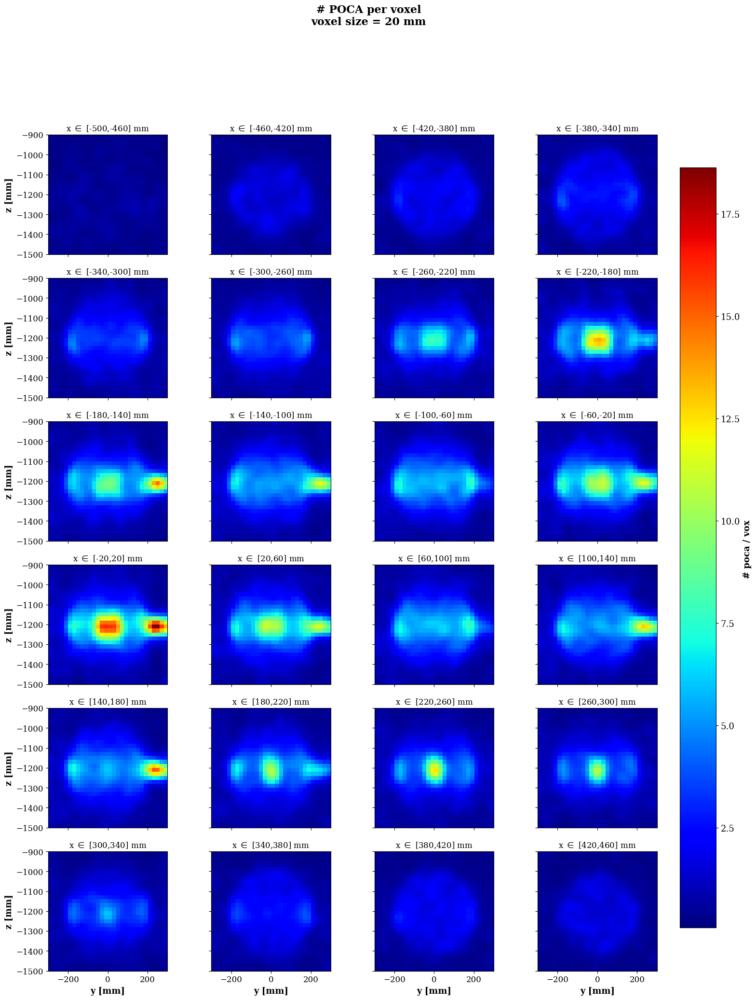

In [32]:
dim = 0 # YZ view

poca.plot_pred_by_slice(
    voi = voi, # the volume of interest
    dim = dim, # Projection
    xyz_voxel_preds=smooth_prediction_1, # 3D prediction to plot
    voi_slice = (0, voi.n_vox_xyz[dim] - 2), # The range of voxels to consider
    ncols = 4, # The number of columns in the plot
    nslice_per_plot=2, # The number of voxel layer per plot
    filename = str(poca.output_dir) + "/no_dtheta_cut_smooth", # Where to save the plot
    fig_suptitle="# POCA per voxel",
    colorbar_label="# poca / vox",
)

In the example below, we used the same kernel size along the $x$, $y$ and $z$ direction:

```python
sigma_x, sigma_y, sigma_z = 1., 1., 1.
sigma = (sigma_x, sigma_y, sigma_z)
```

Given that scattering density predictions are naturally blured along the vertical dimension, it could be intersting to have `sigma_xy != sigma_z`.

**Question**

- What is the optimal value of the kernel size?

***Help***: By producing scattering density plots obtained from various kernel sizes, one can get an idea of which values are suitable.

Below is an example of a function that can produce plots for various value of `sigma_x`, `sigma_y` and `sigma_z`: 

In [33]:
from typing import List, Optional
from pathlib import Path

def kernel_size_scan(
        kernel_sizes: List[Tuple[float, ...]], 
        poca: POCA, 
        directory: Optional[str] = None) -> None:

    from utils.tools import apply_gaussian_filter
    from utils.save import AbsSave

    # Create directory to sae the plots
    directory = (str(poca.output_dir) + "/kernel_size_scan/") if directory is None else directory
    AbsSave.create_directory(Path(directory))

    # Loop over kernel sizes
    for kernel_size in kernel_sizes:   

        # Compute smoothed predictions
        smoothed_pred = apply_gaussian_filter(poca.n_poca_per_vox, sigma = kernel_size)

        # Plot name 
        plot_name = f"{kernel_size[0]*10:.0f}_{kernel_size[1]*10:.0f}_{kernel_size[2]*10:.0f}_kernel_n_poca_preds"

        # Plot the predictions using your favorite plotting methods
        for dim in (0, 1, 2):
            poca.plot_pred_by_slice(
                voi = voi, # the volume of interest
                dim = dim, # Projection
                xyz_voxel_preds=smoothed_pred, # 3D prediction to plot
                voi_slice = (0, voi.n_vox_xyz[dim] - 2), # The range of voxels to consider
                ncols = 4, # The number of columns in the plot
                nslice_per_plot=2, # The number of voxel layer per plot
                filename = directory + plot_name + "sliced", # Where to save the plot
                fig_suptitle="# POCA per voxel",
                colorbar_label="# poca / vox",
            )

            poca.plot_pred_slice(
                voi = voi, # The volume of interest
                xyz_voxel_preds=smoothed_pred, # 3D prediction to plot
                dim = dim, # Projection
                filename = directory + plot_name, # Where to save the plot
                voi_slice = (0, voi.n_vox_xyz[dim] - 1), # The range of voxels to consider
                fig_suptitle="# poca points per voxel", # Title of the figure
                pred_label = "# poca\nper vox",
                pred_unit = ""
            )

In [34]:
# Choose kernel sizes
kernel_sizes_homogeneous = [tuple(x * np.array([0.1, 0.1, 0.1])) for x in range(1, 21)]
kernel_sizes_homogeneous

[(0.1, 0.1, 0.1),
 (0.2, 0.2, 0.2),
 (0.30000000000000004, 0.30000000000000004, 0.30000000000000004),
 (0.4, 0.4, 0.4),
 (0.5, 0.5, 0.5),
 (0.6000000000000001, 0.6000000000000001, 0.6000000000000001),
 (0.7000000000000001, 0.7000000000000001, 0.7000000000000001),
 (0.8, 0.8, 0.8),
 (0.9, 0.9, 0.9),
 (1.0, 1.0, 1.0),
 (1.1, 1.1, 1.1),
 (1.2000000000000002, 1.2000000000000002, 1.2000000000000002),
 (1.3, 1.3, 1.3),
 (1.4000000000000001, 1.4000000000000001, 1.4000000000000001),
 (1.5, 1.5, 1.5),
 (1.6, 1.6, 1.6),
 (1.7000000000000002, 1.7000000000000002, 1.7000000000000002),
 (1.8, 1.8, 1.8),
 (1.9000000000000001, 1.9000000000000001, 1.9000000000000001),
 (2.0, 2.0, 2.0)]


../../output/exercice1/poca/kernel_size_scan directory created


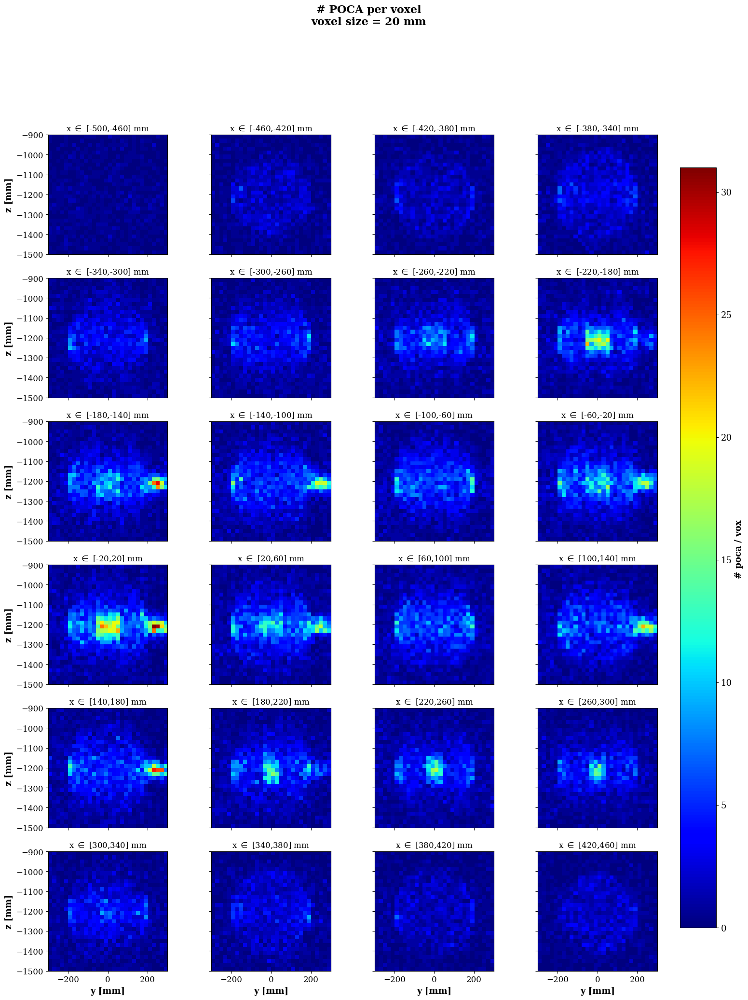

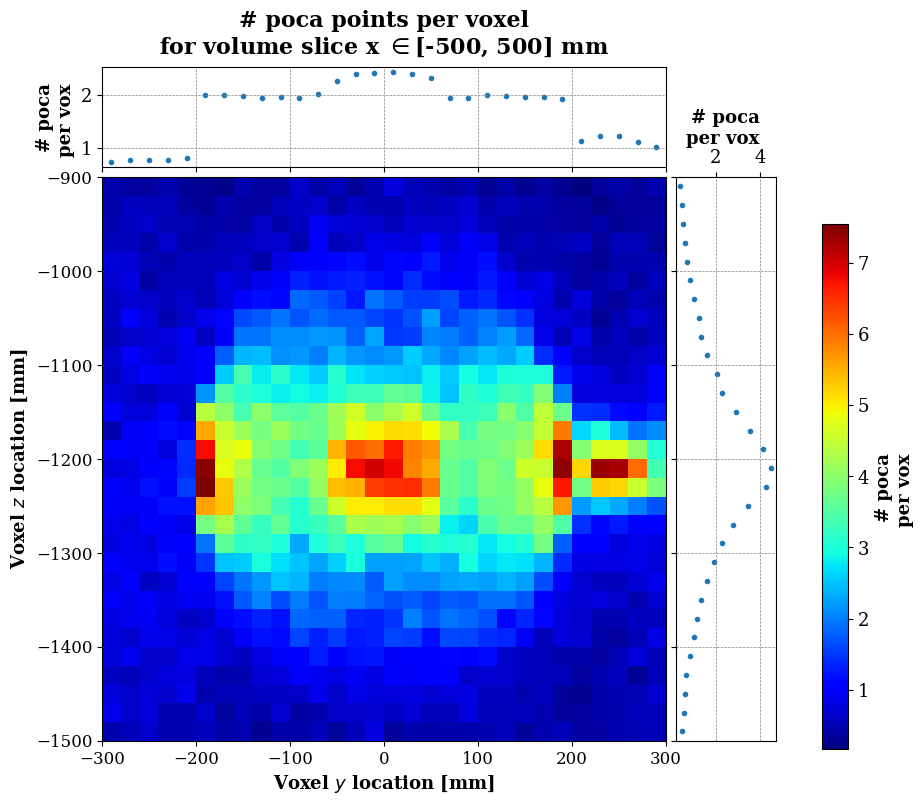

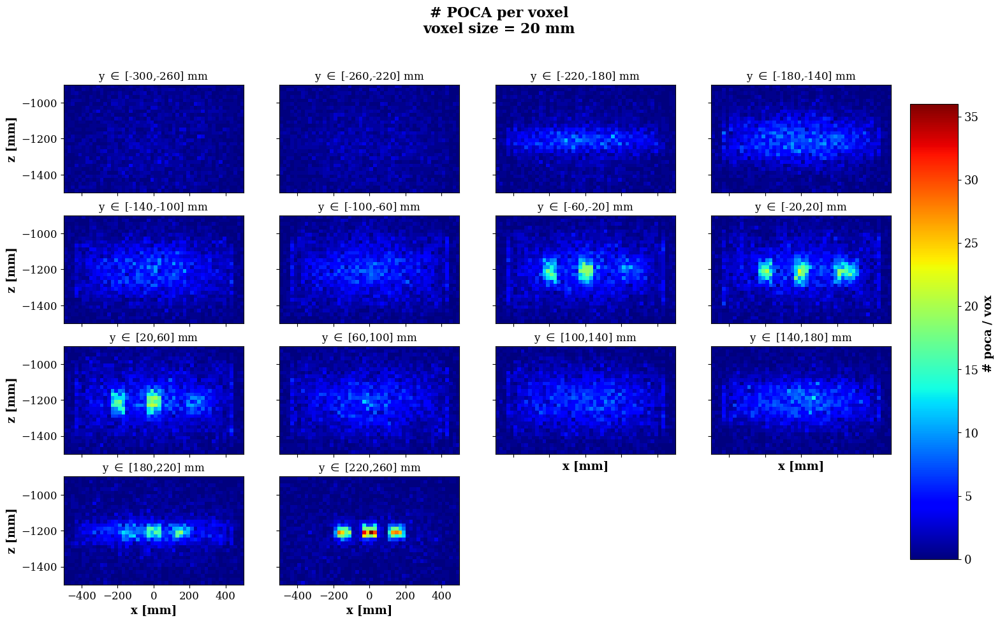

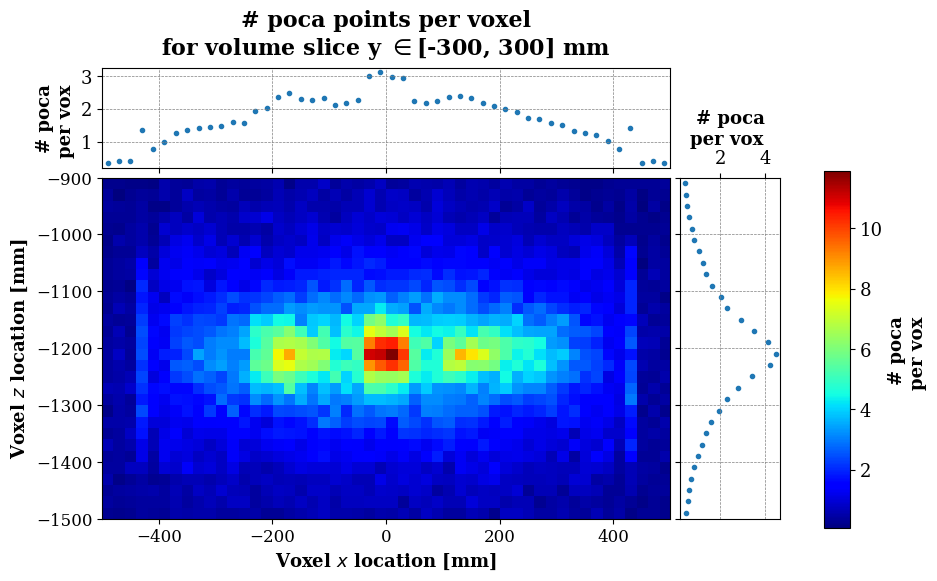

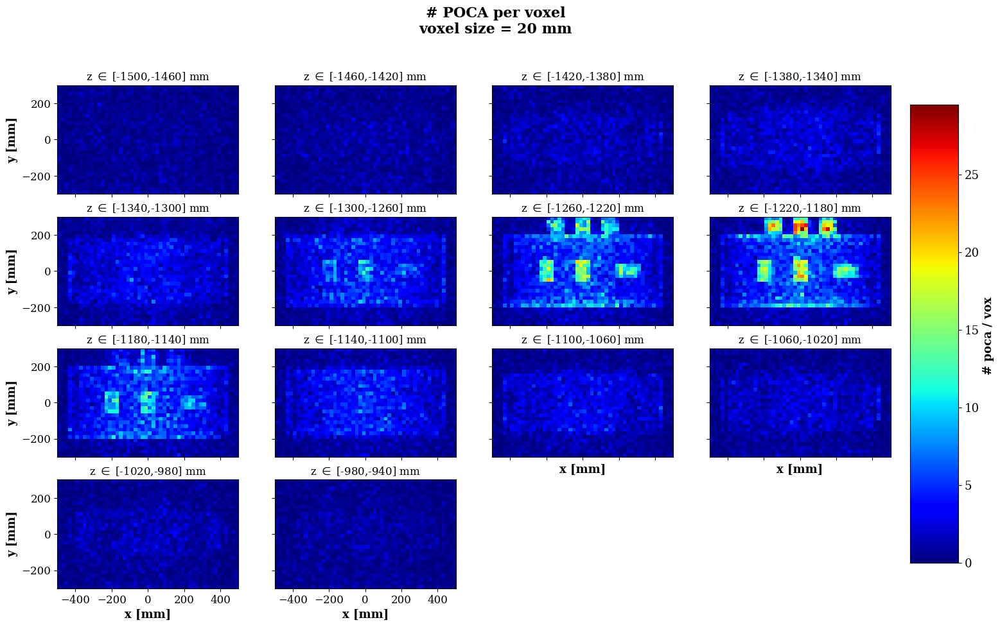

...

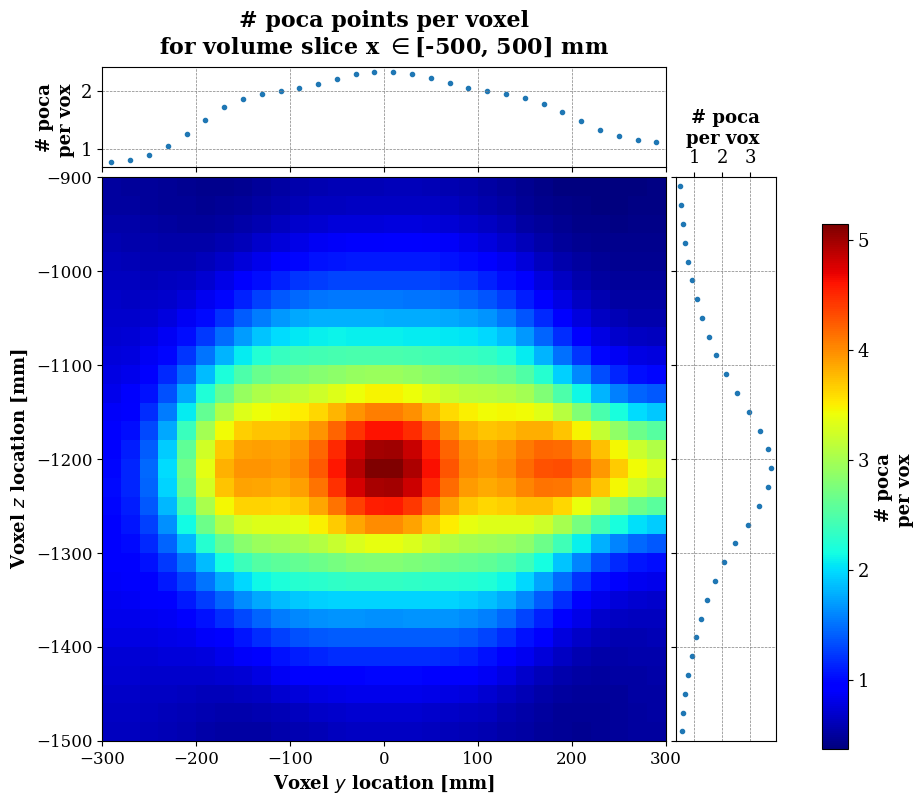

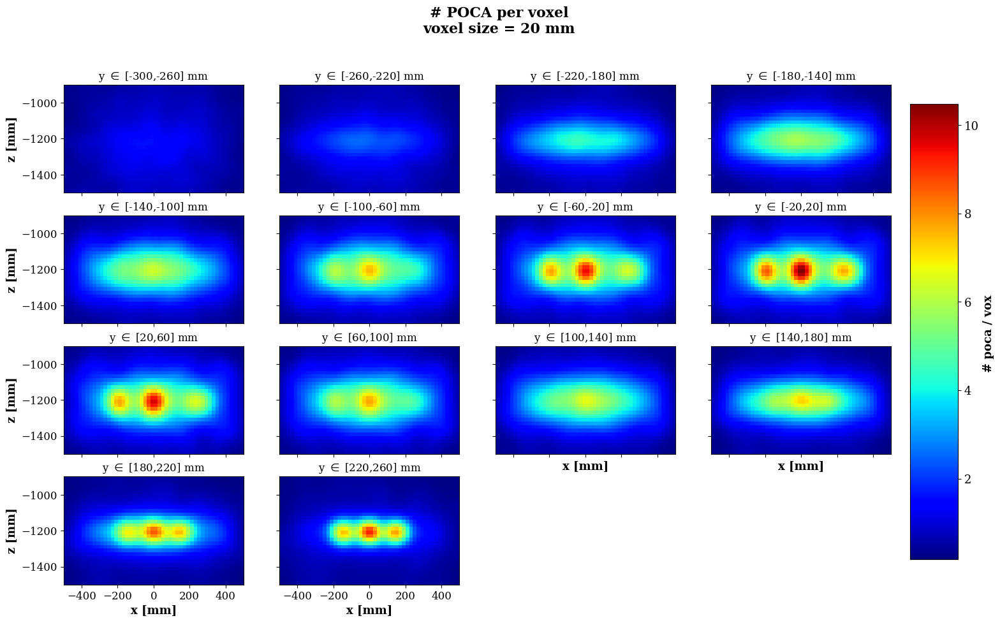

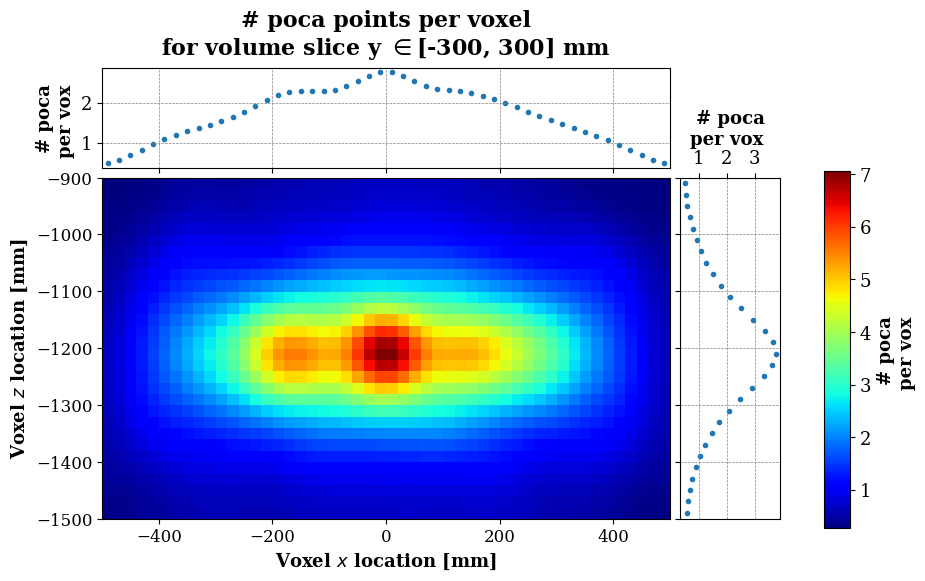

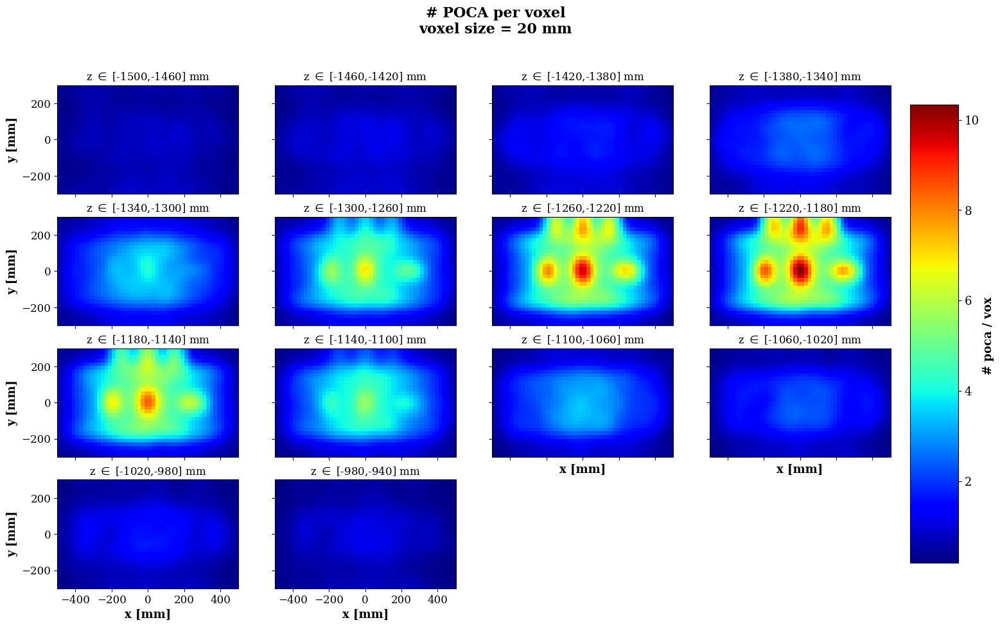

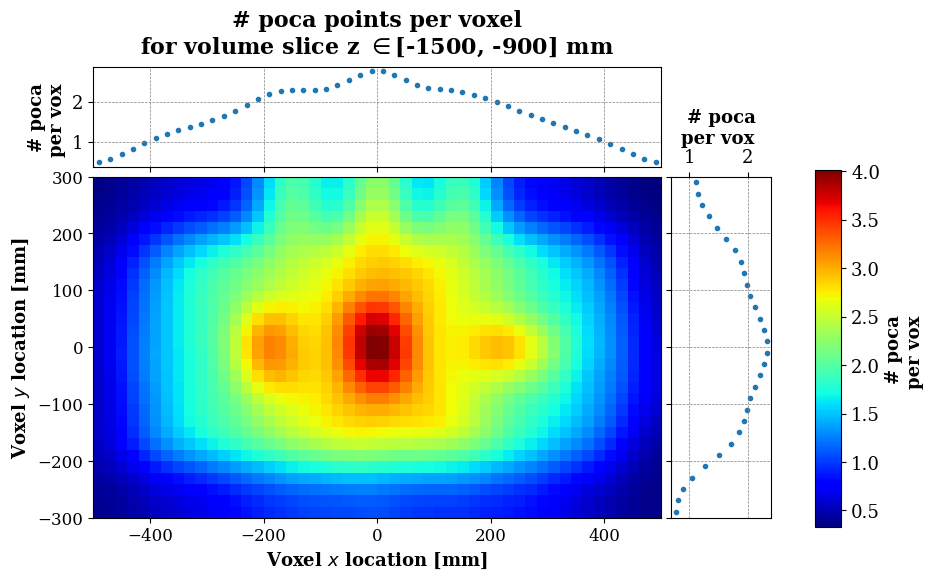

In [35]:
kernel_size_scan(
    kernel_sizes=kernel_sizes_homogeneous, 
    poca = poca, 
    directory=str(poca.output_dir) + "/kernel_size_scan/")